<a href="https://colab.research.google.com/github/jcheng93/Blockchain-Capstone-Project/blob/main/Coinmetrics_Data_Project_Data_Wrangling_and_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


# Define the file paths in your Google Drive
eth_csv_path = '/content/drive/My Drive/Colab Notebooks/Coinmetrics Data/eth_data.csv'
btc_csv_path = '/content/drive/My Drive/Colab Notebooks/Coinmetrics Data/btc_data.csv'

# Load CSV files into DataFrames
eth_df = pd.read_csv(eth_csv_path, index_col = 'index')
btc_df = pd.read_csv(btc_csv_path, index_col = 'index')


Mounted at /content/drive


In [ ]:
print(eth_df.info())
print(btc_df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 2450 entries, 2017-01-03 to 2023-09-18
Data columns (total 29 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   AdrActCnt                        2450 non-null   int64  
 1   AdrBalNtv0.1Cnt                  2450 non-null   int64  
 2   CapMVRVCur                       2450 non-null   float64
 3   FeeMedNtv                        2450 non-null   float64
 4   FeeTotNtv                        2450 non-null   float64
 5   FlowInExNtv                      2450 non-null   float64
 6   FlowOutExNtv                     2450 non-null   float64
 7   GasUsedTx                        2450 non-null   int64  
 8   ReferenceRateUSD                 2450 non-null   float64
 9   SplyFF                           2450 non-null   float64
 10  TxCnt                            2450 non-null   int64  
 11  TxTfrValAdjNtv                   2450 non-null   float64
 12  Volume    

We need to test for stationarility of explanatory variables, Smooth variables, take differences, transformations, normalize

1) Pct_change for Price = returns.
2) 15, 30, 90 day std deviations of returns (annualized)
3) Create smoothing functions that takes in 2 arguments (series, window)
4) Create Z Score Function that takes in 2 arguments (series, window) : Z score normalizes series.
5) Macro data may need to be converted to YoY% change numbers because of industry standards.

We can use ADF to test for stationary time series.


In [ ]:
#Create price-return column and 15d, 30d, 90d volatility of ETH and BTC returns

# Calculate the percentage change of 'ReferenceRateUSD' and store it in a new column
eth_df['price_pct_change'] = eth_df['ReferenceRateUSD'].pct_change() * 100
btc_df['price_pct_change'] = btc_df['ReferenceRateUSD'].pct_change() * 100

# Calculate the annualized rolling standard deviations and create new columns
eth_df['std15'] = eth_df['price_pct_change'].rolling(window=15).std()*np.sqrt(365)
eth_df['std30'] = eth_df['price_pct_change'].rolling(window=30).std()*np.sqrt(365)
eth_df['std90'] = eth_df['price_pct_change'].rolling(window=90).std()*np.sqrt(365)

# Calculate the annualized rolling standard deviations and create new columns
btc_df['std15'] = btc_df['price_pct_change'].rolling(window=15).std()*np.sqrt(365)
btc_df['std30'] = btc_df['price_pct_change'].rolling(window=30).std()*np.sqrt(365)
btc_df['std90'] = btc_df['price_pct_change'].rolling(window=90).std()*np.sqrt(365)


In [ ]:
from statsmodels.tsa.stattools import adfuller

#Define function to test for whether the time series is stationary
def adf_test_for_columns(df):
    # Create an empty list to store individual DataFrames for each column
    adf_results_list = []

    # Loop through each column of the input DataFrame
    for column in df.columns:
        series_name = column

        # Drop missing values (NaN) from the column's time series
        time_series = df[column].dropna()

        # Perform the ADF test
        adf_result = adfuller(time_series)

        # Extract relevant information from the ADF test result
        adf_statistic = adf_result[0]
        p_value = adf_result[1]
        critical_values = adf_result[4]

        # Create a DataFrame for the current column's ADF test results
        adf_result_df = pd.DataFrame({
            "Series Name": [series_name],
            "ADF Statistic": [adf_statistic],
            "ADF p-value": [p_value],
            "ADF Critical Values": [critical_values]
        })

        # Append the DataFrame to the list
        adf_results_list.append(adf_result_df)

    # Concatenate all individual DataFrames into one DataFrame
    adf_results_df = pd.concat(adf_results_list, ignore_index=True)

    # Determine the conclusion for each series, if P value <0.05, series is non-stationary
    adf_results_df["Conclusion"] = adf_results_df.apply(lambda row: "Stationary" if row["ADF Statistic"] < row["ADF Critical Values"]['5%'] and row["ADF p-value"] < 0.05 else "Non-Stationary", axis=1)

    return adf_results_df


In [ ]:
print(adf_test_for_columns(eth_df))

                        Series Name  ADF Statistic   ADF p-value  \
0                         AdrActCnt      -2.476049  1.214113e-01   
1                   AdrBalNtv0.1Cnt      -1.798509  3.812020e-01   
2                        CapMVRVCur      -2.843369  5.234094e-02   
3                         FeeMedNtv      -3.336057  1.334167e-02   
4                         FeeTotNtv      -3.288488  1.540096e-02   
5                       FlowInExNtv      -4.582448  1.391416e-04   
6                      FlowOutExNtv      -4.526957  1.757235e-04   
7                         GasUsedTx      -1.450360  5.579093e-01   
8                  ReferenceRateUSD      -1.602651  4.822615e-01   
9                            SplyFF      -6.968721  8.777019e-10   
10                            TxCnt      -2.389879  1.446135e-01   
11                   TxTfrValAdjNtv      -3.770405  3.225047e-03   
12                           Volume      -2.570484  9.925238e-02   
13                              DBC      -0.5555

In [ ]:
#Define rolling average function
#Smoothing a series reduces noise. Finding the pct_change of a smooth series helps captures trend changes instead of noise.
def transform(series, window):
    """
    Calculate the rolling average and convert to percentage change with a specified window size.

    Args:
        series (pd.Series): The input time series data.
        window (int): The size of the rolling window.

    Returns:
        pd.Series: A new series containing the percentage change values.
    """
    # Calculate the rolling average using the specified window
    rolling_average = series.rolling(window=window).mean()

    # Calculate the percentage change and multiply by 100 to convert to percentage format
    smoothed_change = rolling_average.pct_change(fill_method=None) * 100

    return smoothed_change




#Calculating z-scores help normalize series vs the std_dev of the series.
def z_score(series, window):
    """
    Calculate the Z-score of the current value compared to the series within a specified window.

    Args:
        series (pd.Series): The input time series data.
        window (int): The size of the window for calculating the mean and standard deviation.

    Returns:
        pd.Series: A new series containing the Z-score values.
    """
    # Calculate the rolling mean and standard deviation within the specified window
    rolling_mean = series.rolling(window=window).mean()
    rolling_std = series.rolling(window=window).std()

    # Calculate the Z-score for each value in the series
    z_scores = (series - rolling_mean) / rolling_std

    return z_scores




In [ ]:
#Define columns in eth_df to transform
# Define a list of columns to apply the transform function to
smooth_columns = ['AdrActCnt', 'AdrBalNtv0.1Cnt', 'CapMVRVCur','FeeMedNtv', 'FeeTotNtv', 'GasUsedTx', 'TxCnt']  #Smooth out CoinMetrics features

# Define the window size for smoothing
window_size = 30  # Adjust as needed

# Loop through the columns and apply the transform function
for column in smooth_columns:
    eth_df[f'{column}_smoothed_change'] = transform(eth_df[column], window=window_size)

# Define a list of columns to apply the Z-score function to
zscore_columns = ['FlowInExNtv', 'FlowOutExNtv', 'TxTfrValAdjNtv', 'Volume', 'SplyFF']
# Loop through the columns and apply the zscore function
for column in zscore_columns:
    eth_df[f'{column}_zscore'] = z_score(eth_df[column], window=window_size)

#We need to calculate the daily pct_change of these indices
return_columns = ['DBC', 'GLD', 'USO', 'UUP', 'IXIC', 'SPX', '2Y Yield', '10Y Yield']
for column in return_columns:
    eth_df[f'{column}_pct_change'] = eth_df[column].pct_change()*100

#We need to calculate the 1 month diff of these macro indices
macro_columns = ['M2 YoY', 'M2 Velocity', 'Real PCE YoY', 'NonFarm Payrolls YoY', 'Industrial Production Index YoY', 'Headline CPI YoY', 'Real GDP YoY', 'Unemployment Rate']
for column in macro_columns:
    eth_df[f'{column}_MoM_change'] = eth_df[column].diff(periods=30)

In [ ]:
print(eth_df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 2450 entries, 2017-01-03 to 2023-09-18
Data columns (total 61 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   AdrActCnt                                   2450 non-null   int64  
 1   AdrBalNtv0.1Cnt                             2450 non-null   int64  
 2   CapMVRVCur                                  2450 non-null   float64
 3   FeeMedNtv                                   2450 non-null   float64
 4   FeeTotNtv                                   2450 non-null   float64
 5   FlowInExNtv                                 2450 non-null   float64
 6   FlowOutExNtv                                2450 non-null   float64
 7   GasUsedTx                                   2450 non-null   int64  
 8   ReferenceRateUSD                            2450 non-null   float64
 9   SplyFF                                      2450 non-null   float64
 10  Tx

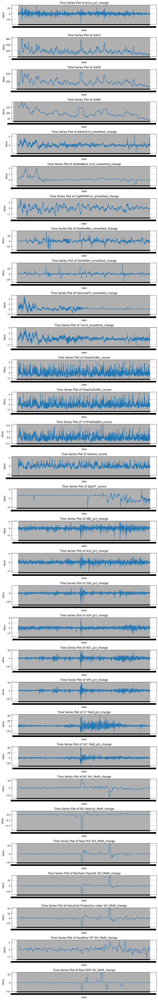

In [ ]:
# Define the new columns by slicing columns 29 to 59
new_columns = eth_df.columns[29:60]

# Create a separate subplot for each new column
fig, axes = plt.subplots(len(new_columns), figsize=(10, 2*len(new_columns)))

# Loop through each new column and plot it on a separate subplot
for i, column in enumerate(new_columns):
    ax = axes[i]
    ax.plot(eth_df.index, eth_df[column])
    ax.set_title(f"Time Series Plot of {column}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Value")
    ax.grid(True)

# Adjust the layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

In [ ]:
print(adf_test_for_columns(eth_df[new_columns]))

                                   Series Name  ADF Statistic   ADF p-value  \
0                             price_pct_change     -13.261843  8.367816e-25   
1                                        std15      -6.091035  1.036370e-07   
2                                        std30      -5.681937  8.447137e-07   
3                                        std90      -2.623597  8.821764e-02   
4                    AdrActCnt_smoothed_change      -7.422885  6.664521e-11   
5              AdrBalNtv0.1Cnt_smoothed_change      -3.925341  1.856069e-03   
6                   CapMVRVCur_smoothed_change     -10.507792  1.043313e-18   
7                    FeeMedNtv_smoothed_change      -8.846991  1.610706e-14   
8                    FeeTotNtv_smoothed_change      -7.800191  7.529258e-12   
9                    GasUsedTx_smoothed_change      -6.663913  4.770544e-09   
10                       TxCnt_smoothed_change      -7.225287  2.060701e-10   
11                          FlowInExNtv_zscore      

In [ ]:
# Lets do the same for btc_df

print(adf_test_for_columns(btc_df))

                        Series Name  ADF Statistic  ADF p-value  \
0                         AdrActCnt      -1.925129     0.320334   
1                   AdrBalNtv0.1Cnt      -0.283665     0.927786   
2                        CapMVRVCur      -2.556206     0.102391   
3                          DiffLast       1.955311     0.998612   
4                         FeeMedNtv      -3.552735     0.006732   
5                         FeeTotNtv      -3.682028     0.004373   
6                       FlowInExNtv      -3.872306     0.002248   
7                      FlowOutExNtv      -4.146567     0.000810   
8                          HashRate       2.793927     1.000000   
9                  ReferenceRateUSD      -1.738035     0.411630   
10                           SplyFF      -1.720963     0.420345   
11              SplyMiner1HopAllNtv      -1.529065     0.519087   
12                            TxCnt      -0.827689     0.810853   
13                   TxTfrValAdjNtv      -2.694640     0.07497

In [ ]:
#Define columns in btc_df to transform
# Define a list of columns to apply the transform function to
smooth_columns = ['AdrActCnt', 'AdrBalNtv0.1Cnt', 'CapMVRVCur', 'DiffLast', 'HashRate', 'FeeMedNtv', 'FeeTotNtv', 'TxCnt']  #Smooth out CoinMetrics features

# Define the window size for smoothing
window_size = 30  # Adjust as needed

# Loop through the columns and apply the transform function
for column in smooth_columns:
    btc_df[f'{column}_smoothed_change'] = transform(btc_df[column], window=window_size)

# Define a list of columns to apply the Z-score function to
zscore_columns = ['FlowInExNtv', 'FlowOutExNtv', 'TxTfrValAdjNtv', 'Volume', 'SplyFF', 'SplyMiner1HopAllNtv']
# Loop through the columns and apply the zscore function
for column in zscore_columns:
    btc_df[f'{column}_zscore'] = z_score(btc_df[column], window=window_size)

#We need to calculate the daily pct_change of these indices
return_columns = ['DBC', 'GLD', 'USO', 'UUP', 'IXIC', 'SPX', '2Y Yield', '10Y Yield']
for column in return_columns:
    btc_df[f'{column}_pct_change'] = btc_df[column].pct_change()*100

#We need to calculate the 1 month diff of these macro indices
macro_columns = ['M2 YoY', 'M2 Velocity', 'Real PCE YoY', 'NonFarm Payrolls YoY', 'Industrial Production Index YoY', 'Headline CPI YoY', 'Real GDP YoY', 'Unemployment Rate']
for column in macro_columns:
    btc_df[f'{column}_MoM_change'] = btc_df[column].diff(periods=30)

In [ ]:
print(btc_df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 2450 entries, 2017-01-03 to 2023-09-18
Data columns (total 65 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   AdrActCnt                                   2450 non-null   int64  
 1   AdrBalNtv0.1Cnt                             2450 non-null   int64  
 2   CapMVRVCur                                  2450 non-null   float64
 3   DiffLast                                    2450 non-null   float64
 4   FeeMedNtv                                   2450 non-null   float64
 5   FeeTotNtv                                   2450 non-null   float64
 6   FlowInExNtv                                 2450 non-null   float64
 7   FlowOutExNtv                                2450 non-null   float64
 8   HashRate                                    2450 non-null   float64
 9   ReferenceRateUSD                            2450 non-null   float64
 10  Sp

In [ ]:
new_columns_b = btc_df.columns[31:65]
print(adf_test_for_columns(btc_df[new_columns_b]))

                                   Series Name  ADF Statistic   ADF p-value  \
0                             price_pct_change     -34.298836  0.000000e+00   
1                                        std15      -5.516145  1.923099e-06   
2                                        std30      -5.398250  3.415993e-06   
3                                        std90      -2.493719  1.170100e-01   
4                    AdrActCnt_smoothed_change      -7.266043  1.634053e-10   
5              AdrBalNtv0.1Cnt_smoothed_change      -8.768801  2.554152e-14   
6                   CapMVRVCur_smoothed_change      -8.404239  2.189442e-13   
7                     DiffLast_smoothed_change      -7.076827  4.778005e-10   
8                     HashRate_smoothed_change      -6.659472  4.888412e-09   
9                    FeeMedNtv_smoothed_change      -9.068084  4.377079e-15   
10                   FeeTotNtv_smoothed_change      -8.803406  2.082696e-14   
11                       TxCnt_smoothed_change      

In [ ]:
eth_df = eth_df.dropna()
btc_df = btc_df.dropna()

We have created non-stationary features which can be used for machine learning and building prediction models.Let's do some exploration on the data sets

count    2138.000000
mean        0.198023
std         4.873821
min       -43.198894
25%        -2.098859
50%         0.032810
75%         2.585160
max        35.068951
Name: price_pct_change, dtype: float64


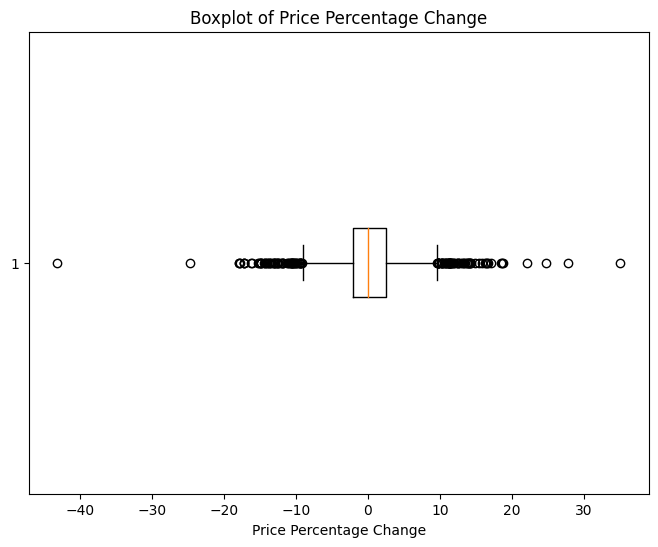

In [ ]:
# Calculate summary statistics for the price_pct_change column
summary_stats = eth_df['price_pct_change'].describe()

# Display the summary statistics
print(summary_stats)

# Create a boxplot for the price_pct_change column
plt.figure(figsize=(8, 6))
plt.boxplot(eth_df['price_pct_change'], vert=False)
plt.title('Boxplot of Price Percentage Change')
plt.xlabel('Price Percentage Change')
plt.show()

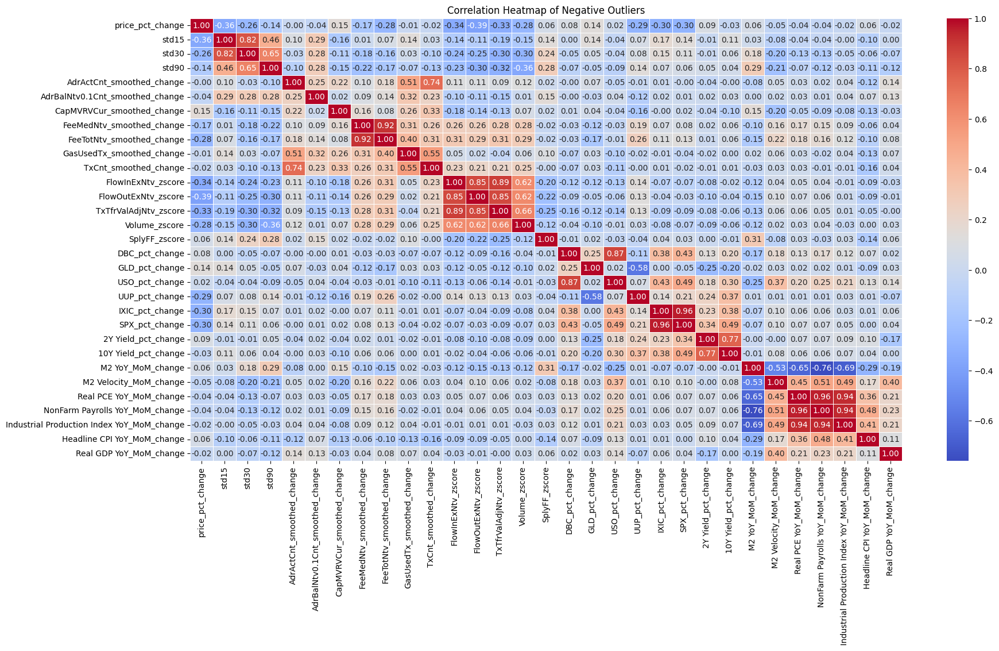

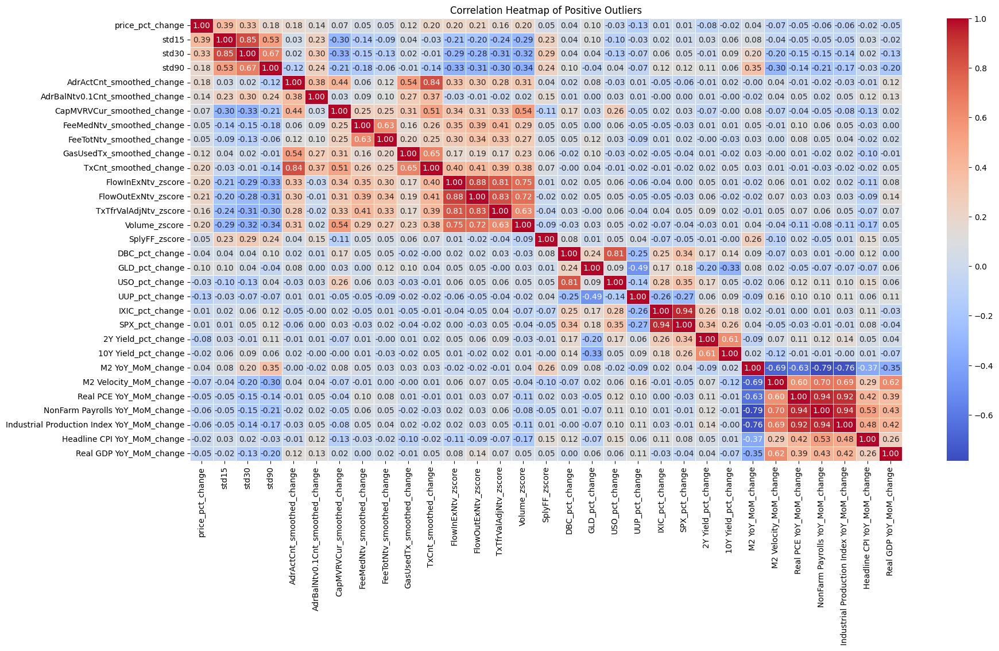

In [ ]:
#Interested in the negative outliers!

# Set a threshold for negative outliers (adjust as needed)
threshold = -5  # You can change this threshold value

# Filter the DataFrame to get rows where price_pct_change is below the threshold
negative_outliers = eth_df[eth_df['price_pct_change'] < threshold]
positive_outliers = eth_df[eth_df['price_pct_change'] > -threshold]
#print(negative_outliers.describe())


# Calculate the correlation matrix
correlation_matrix = negative_outliers[new_columns].corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(20, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Negative Outliers')
plt.show()



# Calculate the correlation matrix
correlation_matrix = positive_outliers[new_columns].corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(20, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Positive Outliers')
plt.show()


In [ ]:
# Initialize variables to keep track of consecutive negative outliers
consecutive_count = 0
total_count = 0  # Total number of consecutive sequences
consecutive_indices = []  # List to store indices of consecutive sequences

# Iterate through the price_pct_change column
for i, pct_change in enumerate(eth_df['price_pct_change']):
    if pct_change < threshold:
        consecutive_count += 1
        if consecutive_count == 1:
            consecutive_start_index = i  # Record the start index of the sequence
    else:
        # Reset consecutive count when a non-negative value is encountered
        if consecutive_count >= 2:
            total_count += 1
            consecutive_indices.extend(range(consecutive_start_index, i))  # Save the indices of the sequence
        consecutive_count = 0

# Check if the last sequence also had 2 or more consecutive negative outliers
if consecutive_count >= 2:
    total_count += 1
    consecutive_indices.extend(range(consecutive_start_index, i + 1))

print(f"Number of observations with 2 or more consecutive negative outliers: {total_count}")

# To access the indices of these sequences:
print("Indices of consecutive negative outlier sequences:", consecutive_indices)



Number of observations with 2 or more consecutive negative outliers: 26
Indices of consecutive negative outlier sequences: [67, 68, 84, 85, 87, 88, 103, 104, 118, 119, 137, 138, 194, 195, 271, 272, 302, 303, 375, 376, 391, 392, 608, 609, 742, 743, 767, 768, 838, 839, 1028, 1029, 1112, 1113, 1201, 1202, 1296, 1297, 1411, 1412, 1491, 1492, 1534, 1535, 1644, 1645, 1674, 1675, 1676, 1677, 1705, 1706, 1825, 1826]


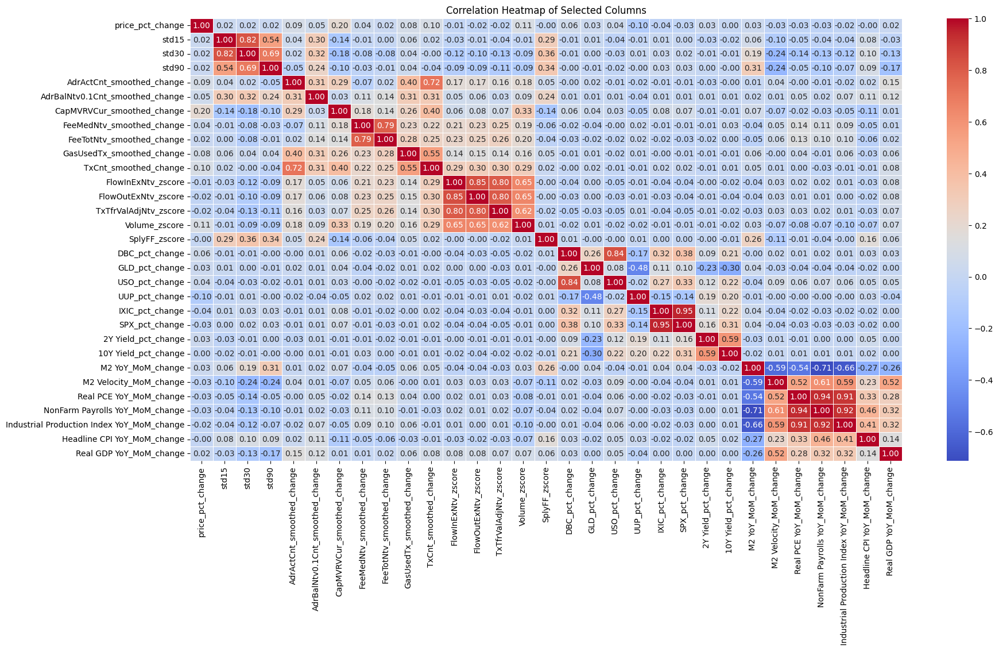

In [ ]:
import seaborn as sns

# Select the columns you want to include in the correlation plot
selected_columns = eth_df[new_columns]

# Calculate the correlation matrix
correlation_matrix = selected_columns.corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(20, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Selected Columns')
plt.show()


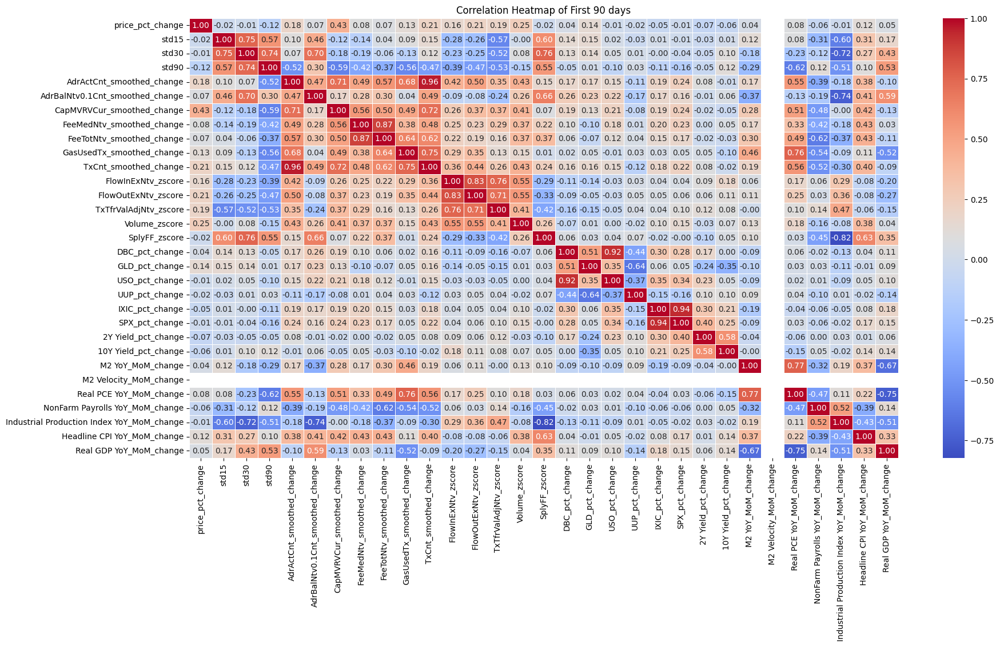

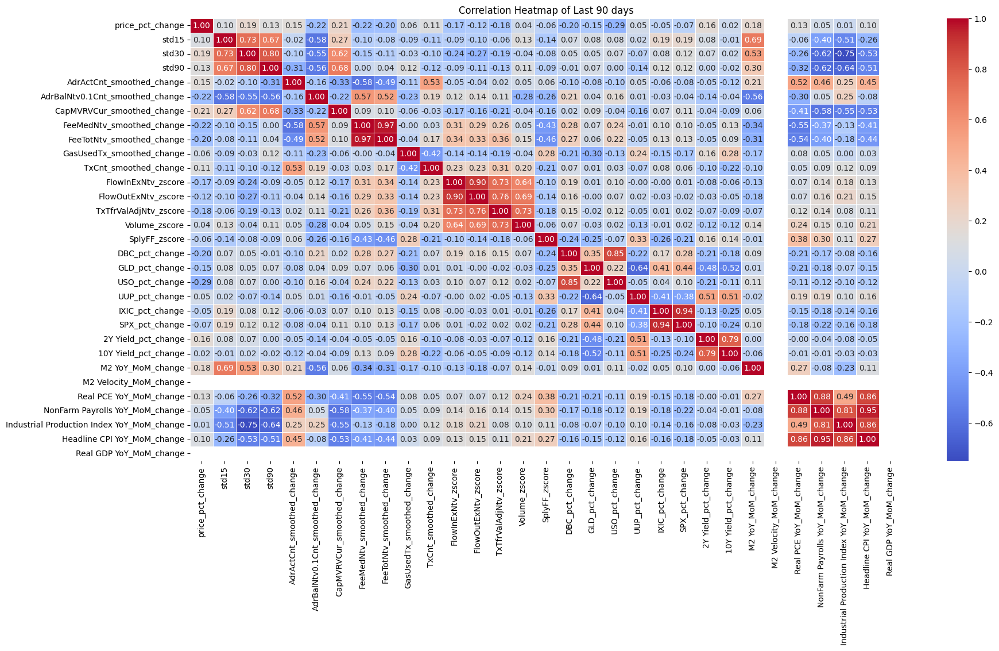

In [ ]:
import seaborn as sns

# Define the number of data points you want to consider (e.g., first and last 365 data points)
num_data_points = 90

# Select the columns you want to include in the correlation plot
selected_columns = eth_df[new_columns]

# Calculate the correlation matrix for the first 365 data points
correlation_matrix_first = selected_columns.iloc[:num_data_points].corr()

# Calculate the correlation matrix for the last 365 data points
correlation_matrix_last = selected_columns.iloc[-num_data_points:].corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(20, 10))
sns.heatmap(correlation_matrix_first, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of First 90 days')
plt.show()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(20, 10))
sns.heatmap(correlation_matrix_last, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Last 90 days')
plt.show()


We notice something quite interesting in the change of correlation of first 90 days vs last 90 days in the time series. Crypto-native metrics are more correlated to pct_change in price at first but macro metrics became more relevant lately.

We can also reduce the number of columns that are highly correlated both at start and last 90 days.

Let's create plots on highly correlated columns and examine their relationship over time - we can decide if any can be removed.

In [ ]:

def plotTimeSeriesRelationship(df, feature1, feature2):

    # Extract the relevant columns from the DataFrame
    x = df.index  # Use the DataFrame index as the x-axis values
    y1 = df[feature1]
    y2 = df[feature2]

    fig, ax1 = plt.subplots(figsize=(20, 6))  # Set the figure size

    # Plot the first feature (y1) in blue
    ax1.scatter(x, y1, s=15, c='blue', label=feature1)
    ax1.set_ylabel(feature1, color='blue')
    ax1.set_xlabel('Time', color='black')
    ax1.set_title(f'{feature1} vs. {feature2} Over Time')

    # Create the second y-axis
    ax2 = ax1.twinx()

    # Plot the second feature (y2) in red
    ax2.scatter(x, y2, s=15, c='red', label=feature2)
    ax2.set_ylabel(feature2, color='red')

    # Set the x-axis label
    ax1.set_xlabel('Time')

    # Add legend
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines + lines2, labels + labels2, loc='upper left')

    plt.show()







We will examine the following series:
1) price_pct_change vs CapMVRVCur_smoothed_change (High Correlation)
2) AdrActCnt_smoothed_change vs TxCnt_smoothed_change (High Correlation)
3) AdrBalNtv0.1Cnt_smoothed_change vs FeeMedNtv_smoothed_change
4) FeeMedNtv_smoothed_change vs FeeTotNtv_smoothed_change (High Correlation)
5) FeeMedNtv_smoothed_change vs SplyFF_zscore (Because of consensus change, this metric may be irrelevant for ETH)
6) Real PCE YoY_MoM_change vs NonFarm Payrolls YoY_MoM_change
6) Headline CPI YoY_MoM_change vs Real PCE YoY_MoM_change

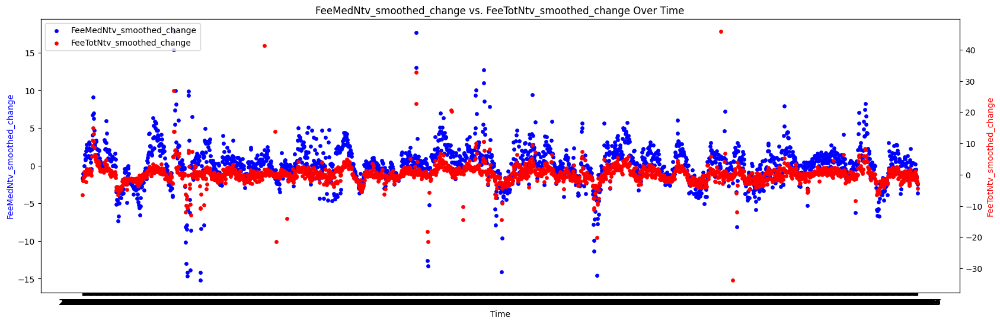

In [ ]:
plotTimeSeriesRelationship(eth_df, 'FeeMedNtv_smoothed_change', 'FeeTotNtv_smoothed_change')

In [ ]:
print(eth_df['M2 Velocity_MoM_change'].head())
#Maybe we can eliminate this column

index
2017-11-10    0.0
2017-11-11    0.0
2017-11-12    0.0
2017-11-13    0.0
2017-11-14    0.0
Name: M2 Velocity_MoM_change, dtype: float64


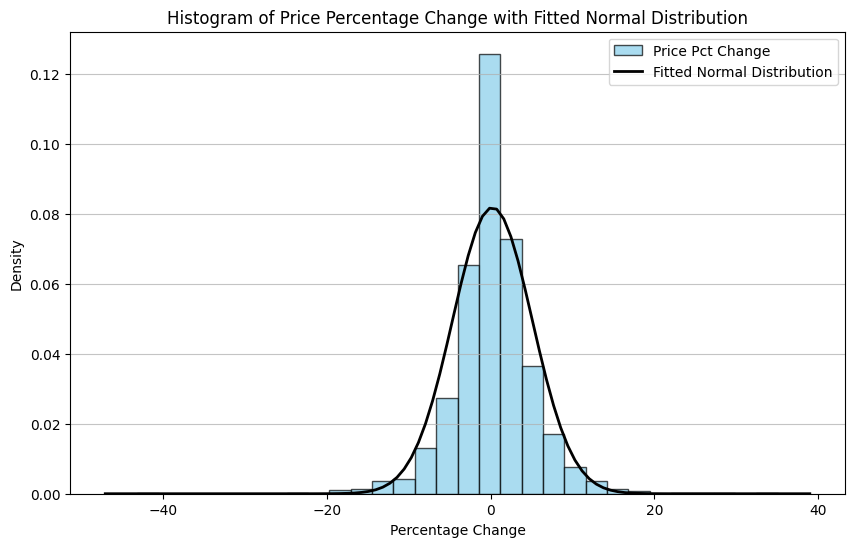

In [ ]:
#Let's look at the distribution of eth returns vs normal distribution

from scipy.stats import norm

price_pct_change = eth_df['price_pct_change']

# Create a histogram plot
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.hist(price_pct_change, bins=30, density=True, color='skyblue', edgecolor='black', alpha=0.7, label='Price Pct Change')  # Adjust the number of bins as needed

# Fit a normal distribution to the data
mu, std = norm.fit(price_pct_change)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2, label='Fitted Normal Distribution')

plt.title('Histogram of Price Percentage Change with Fitted Normal Distribution')
plt.xlabel('Percentage Change')
plt.ylabel('Density')
plt.legend()
plt.grid(axis='y', alpha=0.75)
plt.show()


This looks like price_pct_change is quite similar to a normal distribution.

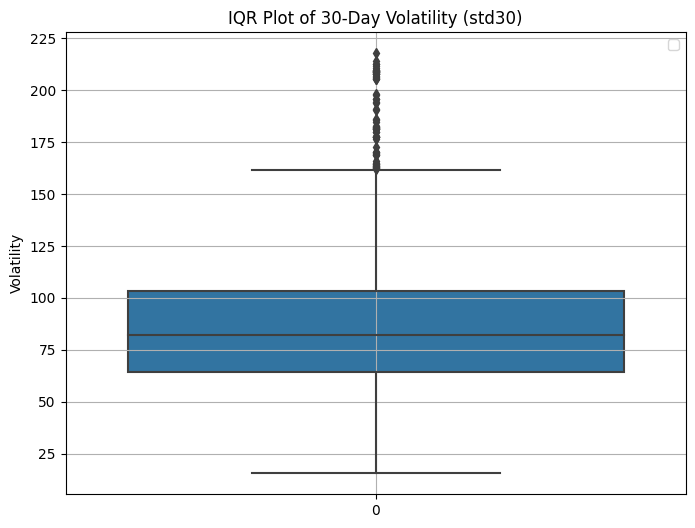

In [ ]:
#Looking at the volatility of the returns.

# Calculate the IQR (Interquartile Range)
Q1 = eth_df['std30'].quantile(0.25)
Q3 = eth_df['std30'].quantile(0.75)
IQR = Q3 - Q1

# Create a box plot with potential outliers highlighted
plt.figure(figsize=(8, 6))
sns.boxplot(data=eth_df['std30'])

plt.title('IQR Plot of 30-Day Volatility (std30)')
plt.ylabel('Volatility')
plt.legend()
plt.grid(True)
plt.show()


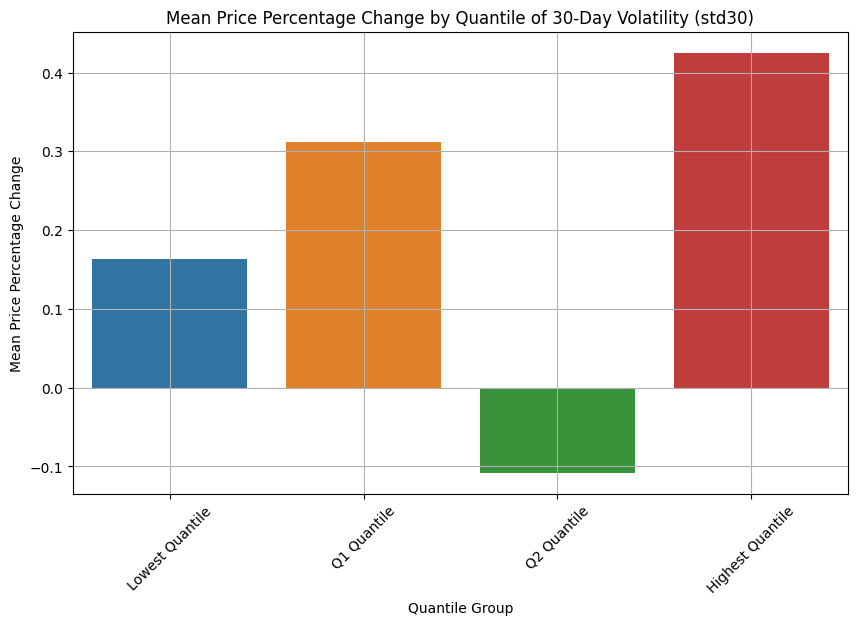

In [ ]:

# Calculate quantiles of std30 to create groups (e.g., 4 quantiles)
quantiles = eth_df['std30'].quantile([0, 0.25, 0.5, 0.75, 1.0])

# Define group labels based on quantiles
group_labels = ['Lowest Quantile', 'Q1 Quantile', 'Q2 Quantile', 'Highest Quantile']

# Assign each data point to a quantile group
eth_df['Quantile Group'] = pd.cut(eth_df['std30'], bins=quantiles, labels=group_labels, include_lowest=True)

# Group by quantile group and calculate the mean of price_pct_change
grouped_df = eth_df.groupby('Quantile Group')['price_pct_change'].mean().reset_index()

# Create a bar plot to visualize the mean price_pct_change for each quantile group
plt.figure(figsize=(10, 6))
sns.barplot(x='Quantile Group', y='price_pct_change', data=grouped_df, order=group_labels)
plt.title('Mean Price Percentage Change by Quantile of 30-Day Volatility (std30)')
plt.xlabel('Quantile Group')
plt.ylabel('Mean Price Percentage Change')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

# Remove the 'Quantile Group' column to avoid modifying eth_df
eth_df.drop('Quantile Group', axis=1, inplace=True)


<ipython-input-28-2510f1b7e8ca>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_df.loc[:, 'Quantile Group'] = pd.cut(plot_df['std30'], bins=quantiles, labels=group_labels, include_lowest=True)


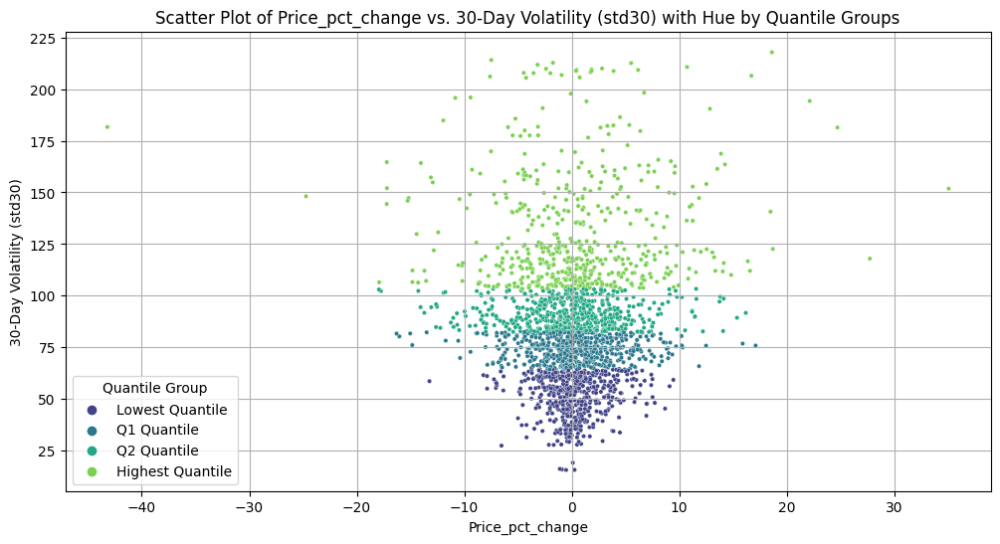

In [ ]:
# Create a new DataFrame by selecting 'ReferenceRateUSD' and 'std30' columns
plot_df = eth_df[['price_pct_change', 'std30']]

# Assign each data point to a quantile group using .loc
plot_df.loc[:, 'Quantile Group'] = pd.cut(plot_df['std30'], bins=quantiles, labels=group_labels, include_lowest=True)

# Create a scatter plot with 'Price_pct_change' as the x-axis and 'std30' as the y-axis, colored by quantile groups
plt.figure(figsize=(12, 6))
sns.scatterplot(data=plot_df, x='price_pct_change', y='std30', hue='Quantile Group', palette='viridis', s=10)
plt.title('Scatter Plot of Price_pct_change vs. 30-Day Volatility (std30) with Hue by Quantile Groups')
plt.xlabel('Price_pct_change')
plt.ylabel('30-Day Volatility (std30)')
plt.legend(title='Quantile Group')
plt.grid(True)
plt.show()




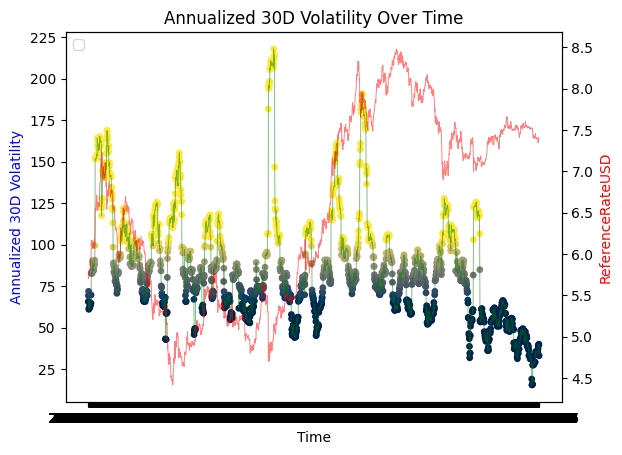

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plotGraph(data):
    %matplotlib inline

    x = data.index
    y1 = data['std30']  # Use 'std30' as the Annualized 30D Volatility column
    y2 = np.log(data['ReferenceRateUSD'])

    # Calculate iqr values
    q1 = np.percentile(y1, 25)
    q2 = np.percentile(y1, 50)
    q3 = np.percentile(y1, 75)

    fig, ax1 = plt.subplots()

    # Plot the first y-axis data (Annualized 30D Volatility)
    scatter = ax1.scatter(x, y1, s=15, c=y1, cmap='cividis')
    scatter.set_clim(q1, q3)  # Set the colormap threshold
    ax1.plot(x, y1, color='green', linewidth=0.7, alpha=0.5)
    ax1.set_ylabel('Annualized 30D Volatility', color='blue')
    ax1.set_xlabel('Time', color='black')
    ax1.set_title('Annualized 30D Volatility Over Time')

    # Create the second y-axis
    ax2 = ax1.twinx()

    # Plot the second y-axis data (ReferenceRateUSD)
    sns.lineplot(x=x, y=y2, ax=ax2, color='red', linewidth=0.7, alpha=0.5)
    ax2.set_ylabel('ReferenceRateUSD', color='red')

    # Set the x-axis label
    ax1.set_xlabel('Time')

    # Add legend
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines + lines2, labels + labels2, loc='upper left')

    plt.show()

# Example usage:
plotGraph(eth_df)


count    2360.000000
mean        0.213016
std         3.928188
min       -37.534952
25%        -1.416039
50%         0.137719
75%         1.886560
max        25.113704
Name: price_pct_change, dtype: float64


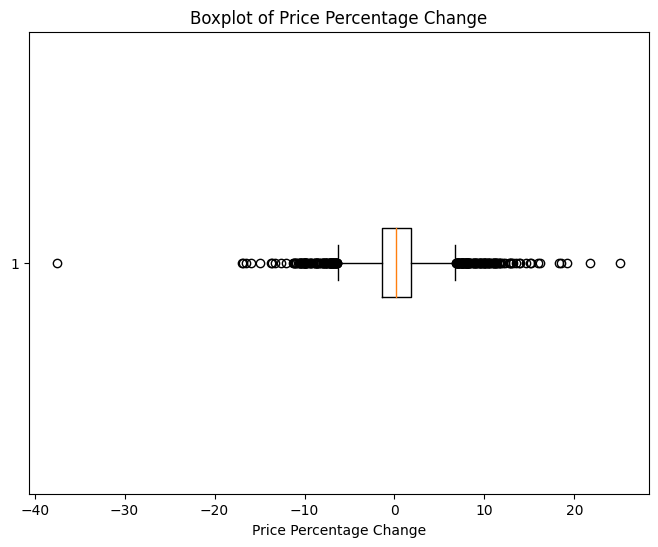

In [ ]:
#Lets repeat the same steps for btc_df

# Calculate summary statistics for the price_pct_change column
summary_stats = btc_df['price_pct_change'].describe()

# Display the summary statistics
print(summary_stats)

# Create a boxplot for the price_pct_change column
plt.figure(figsize=(8, 6))
plt.boxplot(btc_df['price_pct_change'], vert=False)
plt.title('Boxplot of Price Percentage Change')
plt.xlabel('Price Percentage Change')
plt.show()

In [ ]:
print(btc_df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 2360 entries, 2017-04-03 to 2023-09-18
Data columns (total 65 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   AdrActCnt                                   2360 non-null   int64  
 1   AdrBalNtv0.1Cnt                             2360 non-null   int64  
 2   CapMVRVCur                                  2360 non-null   float64
 3   DiffLast                                    2360 non-null   float64
 4   FeeMedNtv                                   2360 non-null   float64
 5   FeeTotNtv                                   2360 non-null   float64
 6   FlowInExNtv                                 2360 non-null   float64
 7   FlowOutExNtv                                2360 non-null   float64
 8   HashRate                                    2360 non-null   float64
 9   ReferenceRateUSD                            2360 non-null   float64
 10  Sp

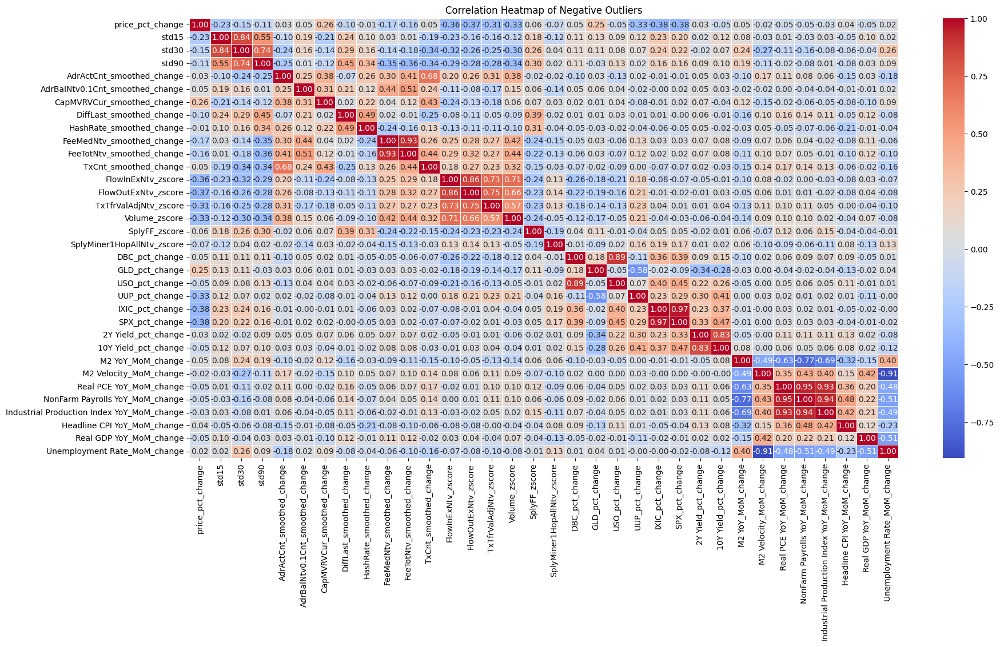

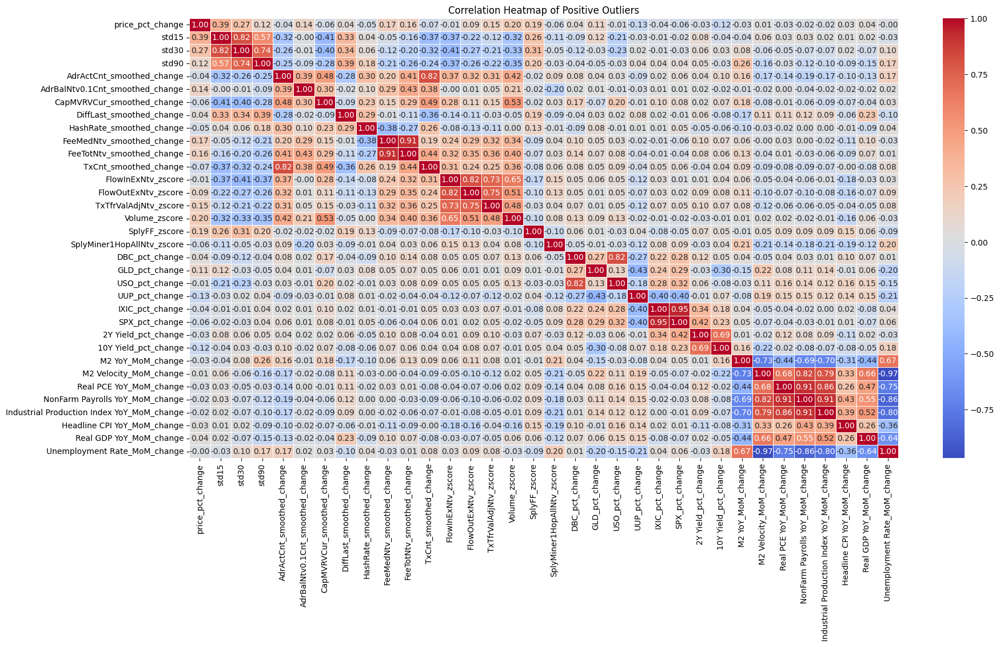

In [ ]:
#Interested in the negative outliers!

new_columns = btc_df.columns[31:65]

# Set a threshold for negative outliers (adjust as needed)
threshold = -5  # You can change this threshold value

# Filter the DataFrame to get rows where price_pct_change is below the threshold
negative_outliers = btc_df[btc_df['price_pct_change'] < threshold]
positive_outliers = btc_df[btc_df['price_pct_change'] > -threshold]
#print(negative_outliers.describe())


# Calculate the correlation matrix
correlation_matrix = negative_outliers[new_columns].corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(20, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Negative Outliers')
plt.show()



# Calculate the correlation matrix
correlation_matrix = positive_outliers[new_columns].corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(20, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Positive Outliers')
plt.show()

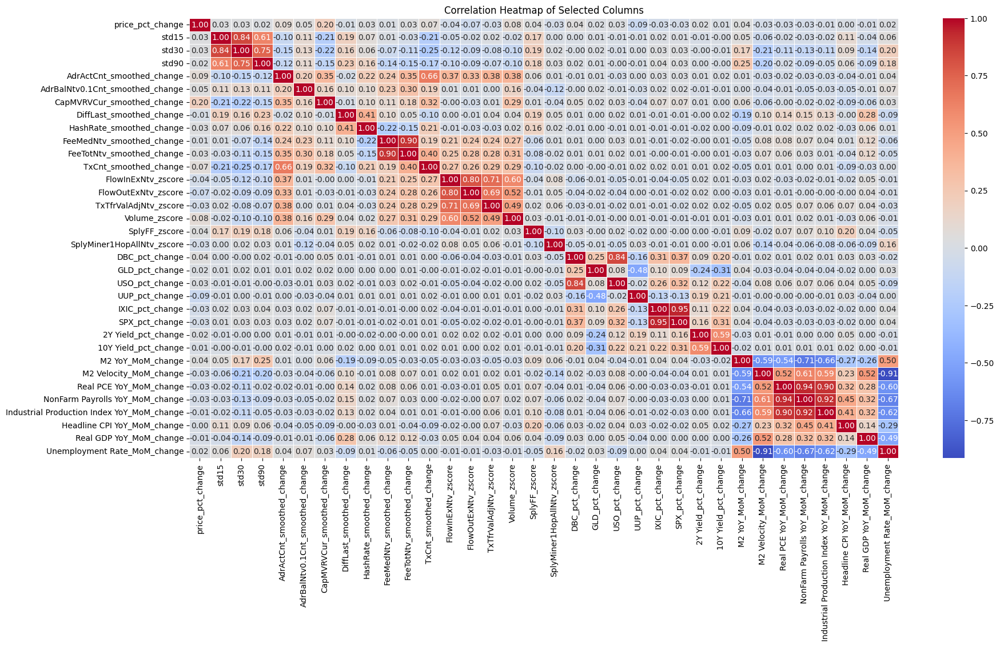

In [ ]:
# we want to look at correlations of the new columns over the entire time series
# Select the columns you want to include in the correlation plot
selected_columns = btc_df[new_columns]

# Calculate the correlation matrix
correlation_matrix = selected_columns.corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(20, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Selected Columns')
plt.show()

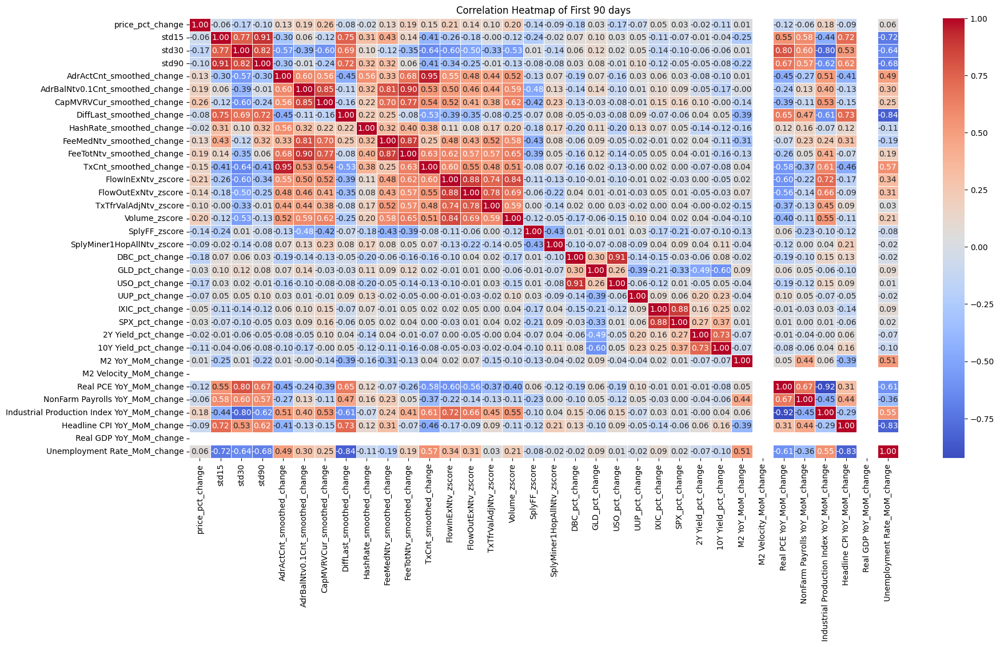

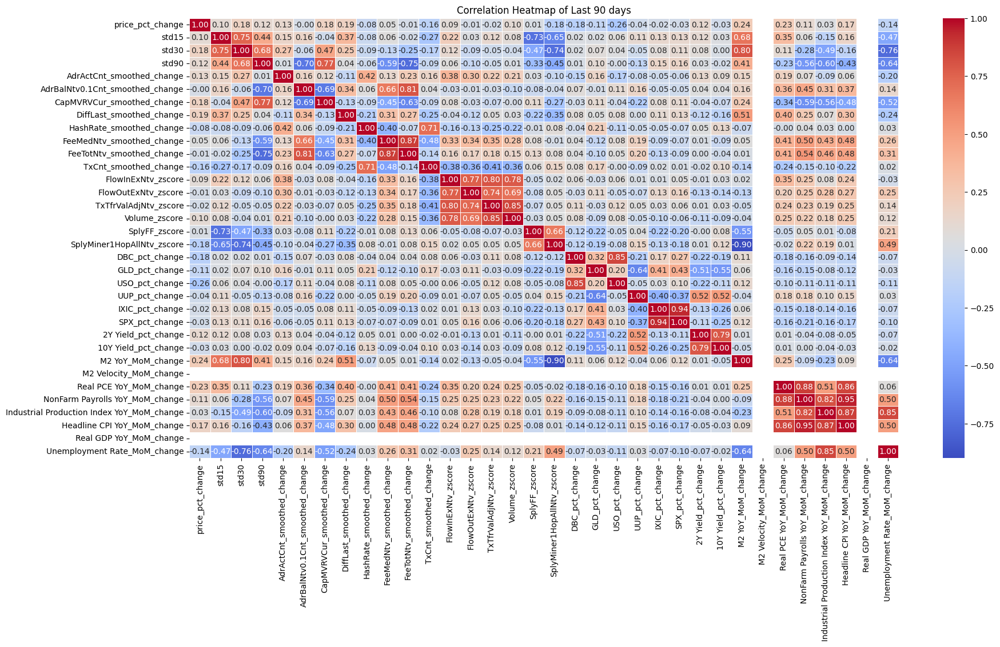

In [ ]:
# Define the number of data points you want to consider (e.g., first and last 90 data points)
num_data_points = 90

# Select the columns you want to include in the correlation plot
selected_columns = btc_df[new_columns]

# Calculate the correlation matrix for the first 365 data points
correlation_matrix_first = selected_columns.iloc[:num_data_points].corr()

# Calculate the correlation matrix for the last 365 data points
correlation_matrix_last = selected_columns.iloc[-num_data_points:].corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(20, 10))
sns.heatmap(correlation_matrix_first, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of First 90 days')
plt.show()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(20, 10))
sns.heatmap(correlation_matrix_last, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Last 90 days')
plt.show()


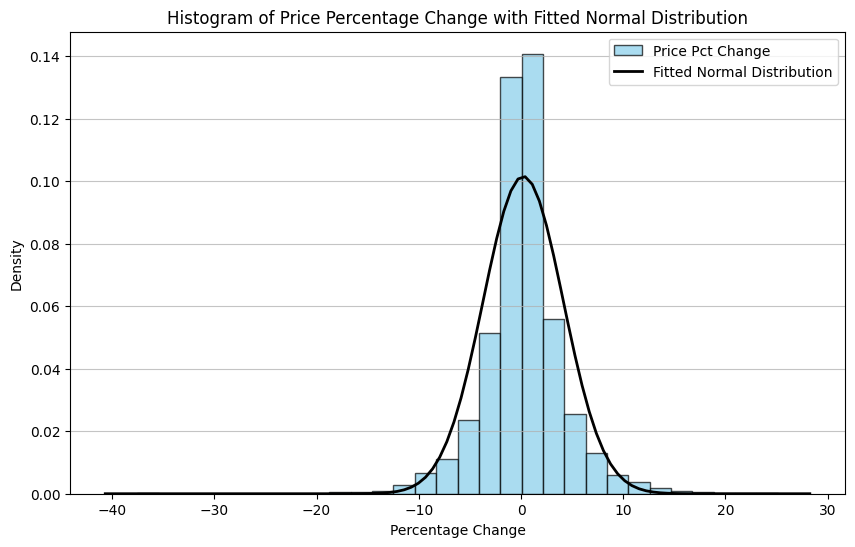

In [ ]:
from scipy.stats import norm

price_pct_change = btc_df['price_pct_change']

# Create a histogram plot
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.hist(price_pct_change, bins=30, density=True, color='skyblue', edgecolor='black', alpha=0.7, label='Price Pct Change')  # Adjust the number of bins as needed

# Fit a normal distribution to the data
mu, std = norm.fit(price_pct_change)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2, label='Fitted Normal Distribution')

plt.title('Histogram of Price Percentage Change with Fitted Normal Distribution')
plt.xlabel('Percentage Change')
plt.ylabel('Density')
plt.legend()
plt.grid(axis='y', alpha=0.75)
plt.show()


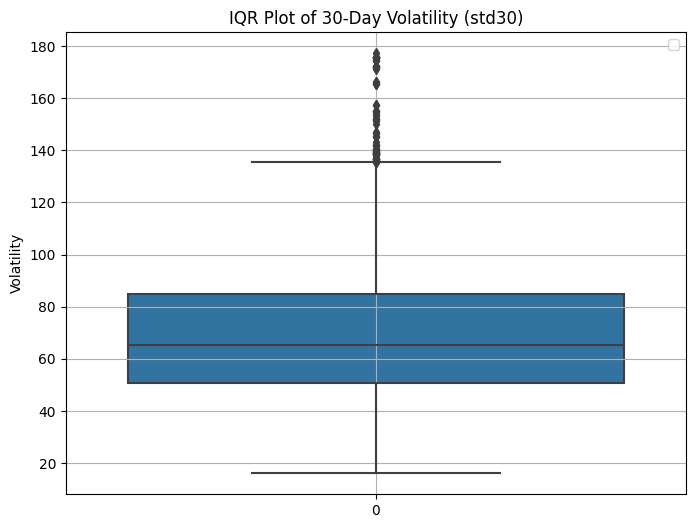

In [ ]:
#Looking at the volatility of the returns.

# Calculate the IQR (Interquartile Range)
Q1 = btc_df['std30'].quantile(0.25)
Q3 = btc_df['std30'].quantile(0.75)
IQR = Q3 - Q1

# Create a box plot with potential outliers highlighted
plt.figure(figsize=(8, 6))
sns.boxplot(data=btc_df['std30'])

plt.title('IQR Plot of 30-Day Volatility (std30)')
plt.ylabel('Volatility')
plt.legend()
plt.grid(True)
plt.show()

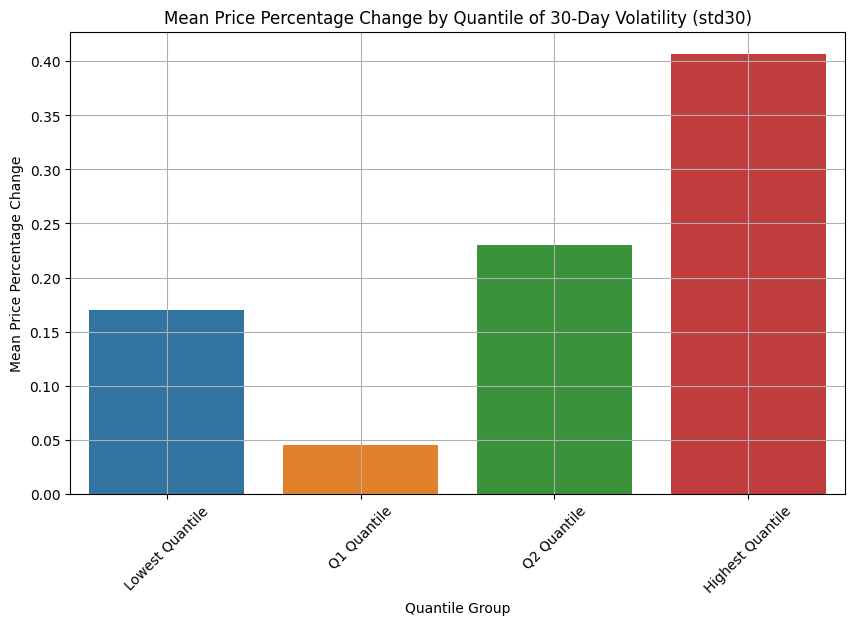

In [ ]:
# Calculate quantiles of std30 to create groups (e.g., 4 quantiles)
quantiles = btc_df['std30'].quantile([0, 0.25, 0.5, 0.75, 1.0])

# Define group labels based on quantiles
group_labels = ['Lowest Quantile', 'Q1 Quantile', 'Q2 Quantile', 'Highest Quantile']

# Assign each data point to a quantile group
btc_df['Quantile Group'] = pd.cut(btc_df['std30'], bins=quantiles, labels=group_labels, include_lowest=True)

# Group by quantile group and calculate the mean of price_pct_change
grouped_df = btc_df.groupby('Quantile Group')['price_pct_change'].mean().reset_index()

# Create a bar plot to visualize the mean price_pct_change for each quantile group
plt.figure(figsize=(10, 6))
sns.barplot(x='Quantile Group', y='price_pct_change', data=grouped_df, order=group_labels)
plt.title('Mean Price Percentage Change by Quantile of 30-Day Volatility (std30)')
plt.xlabel('Quantile Group')
plt.ylabel('Mean Price Percentage Change')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

# Remove the 'Quantile Group' column to avoid modifying btc_df
btc_df.drop('Quantile Group', axis=1, inplace=True)


<ipython-input-38-10b881b727d1>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_df.loc[:, 'Quantile Group'] = pd.cut(plot_df['std30'], bins=quantiles, labels=group_labels, include_lowest=True)


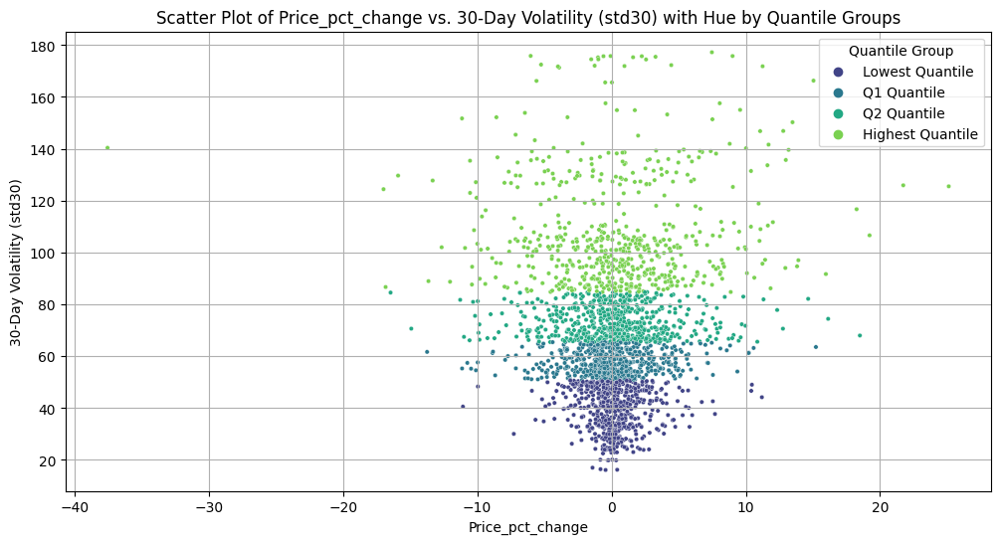

In [ ]:
# Create a new DataFrame by selecting 'ReferenceRateUSD' and 'std30' columns
plot_df = btc_df[['price_pct_change', 'std30']]

# Assign each data point to a quantile group using .loc
plot_df.loc[:, 'Quantile Group'] = pd.cut(plot_df['std30'], bins=quantiles, labels=group_labels, include_lowest=True)

# Create a scatter plot with 'Price_pct_change' as the x-axis and 'std30' as the y-axis, colored by quantile groups
plt.figure(figsize=(12, 6))
sns.scatterplot(data=plot_df, x='price_pct_change', y='std30', hue='Quantile Group', palette='viridis', s=10)
plt.title('Scatter Plot of Price_pct_change vs. 30-Day Volatility (std30) with Hue by Quantile Groups')
plt.xlabel('Price_pct_change')
plt.ylabel('30-Day Volatility (std30)')
plt.legend(title='Quantile Group')
plt.grid(True)
plt.show()

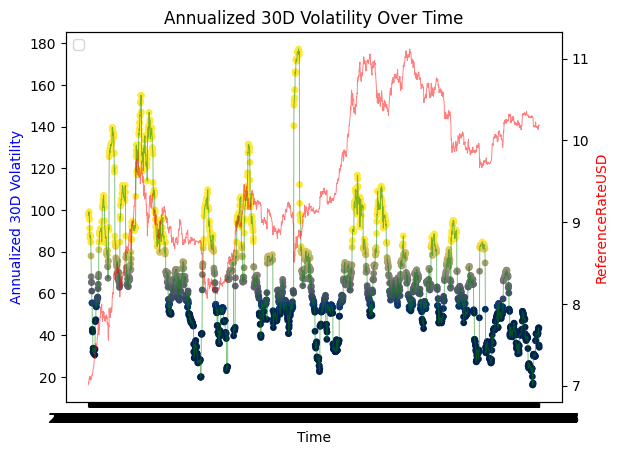

In [ ]:
plotGraph(btc_df)

In [ ]:
plotTimeSeriesRelationship(btc_df, 'DBC_pct_change', 'USO_pct_change')

In [ ]:
#Let's prepare the eth_df and btc_df for ARIMA / Machine learning. First going to remove a few highly correlated columns

# Remove 'FeeMedNtv_smoothed_change' and 'FeeMedNtv' columns from eth_df
eth_df.drop(['FeeMedNtv_smoothed_change', 'FeeMedNtv', 'M2 Velocity_MoM_change', 'IXIC', 'IXIC_pct_change'], axis=1, inplace=True)

# Remove 'FeeMedNtv_smoothed_change' and 'FeeMedNtv' columns from btc_df
btc_df.drop(['FeeMedNtv_smoothed_change', 'FeeMedNtv', 'M2 Velocity_MoM_change', 'IXIC', 'IXIC_pct_change'], axis=1, inplace=True)



In [ ]:
# Save eth_df as a CSV file in Google Drive
eth_df.to_csv('/content/drive/My Drive/Colab Notebooks/Coinmetrics Data/eth_clean_df.csv', index=True)

# Save btc_df as a CSV file in Google Drive
btc_df.to_csv('/content/drive/My Drive/Colab Notebooks/Coinmetrics Data/btc_clean_df.csv', index=True)